# HR Analytics Project- Understanding the Attrition in HR

## Project Description
Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?


## HR Analytics
Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes


## Attrition in HR
Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.


## Attrition affecting Companies
A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.



In [1]:
import warnings
warnings.simplefilter("ignore")
import missingno as ms   #for missing values visualization
import joblib

import pandas as pd
import numpy as np
import seaborn as sns    #for creating heatmap, time series plot, violin plots &so on
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
from scipy.stats import zscore

import scipy
import sklearn
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
import xgboost as xgb
import lightgbm as lgb

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV 

In [2]:
df=pd.read_csv("HR-Employee-Attrition.csv")
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


From above we see that there are total of 1470 rows and 35 columns from which the Attrition column will be our target variable 

In [3]:
#getting data of top 5 column
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
#getting data of bottom 5 column
df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [5]:
df.shape

(1470, 35)

In [6]:
df.columns.tolist()

['Age',
 'Attrition',
 'BusinessTravel',
 'DailyRate',
 'Department',
 'DistanceFromHome',
 'Education',
 'EducationField',
 'EmployeeCount',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'Gender',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'Over18',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

## Exploratory Data Analysis

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

## checking null values

In [8]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

there is no missing values available in dataset

<AxesSubplot:>

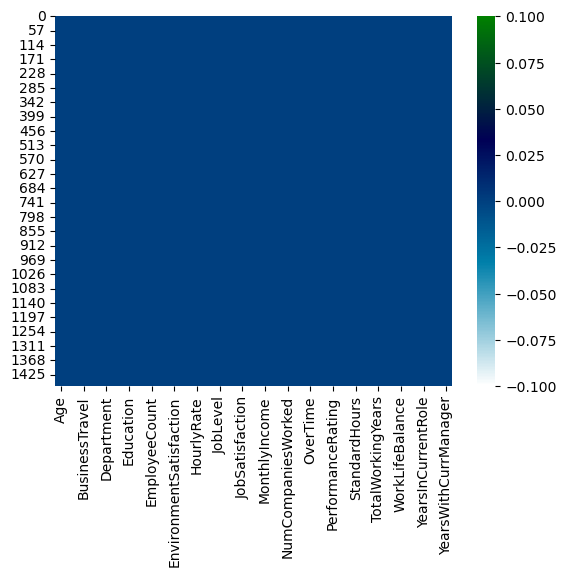

In [9]:
sns.heatmap(df.isnull(),cmap='ocean_r')

heatmap visually defines there is no null value present in the dataset 

<AxesSubplot:>

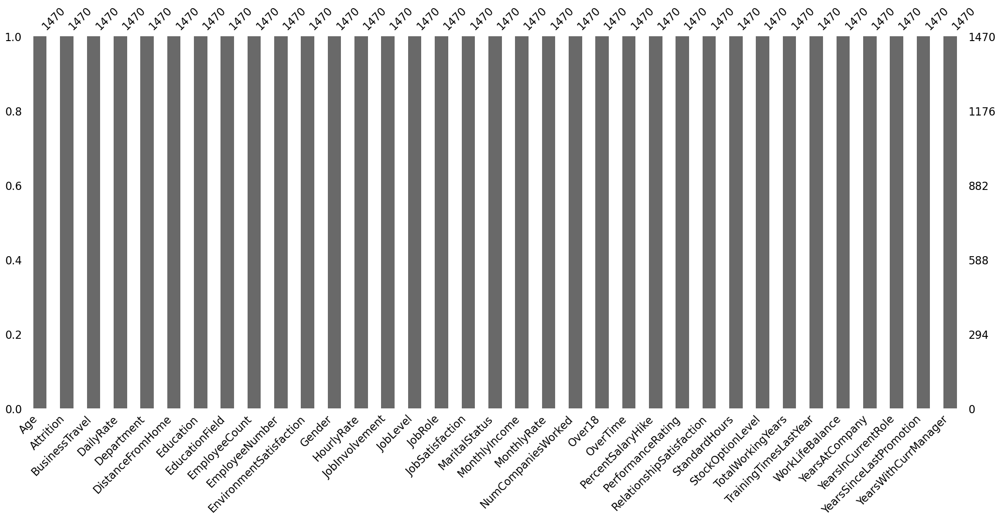

In [10]:
ms.bar(df)

bar chart for missing value

<AxesSubplot:>

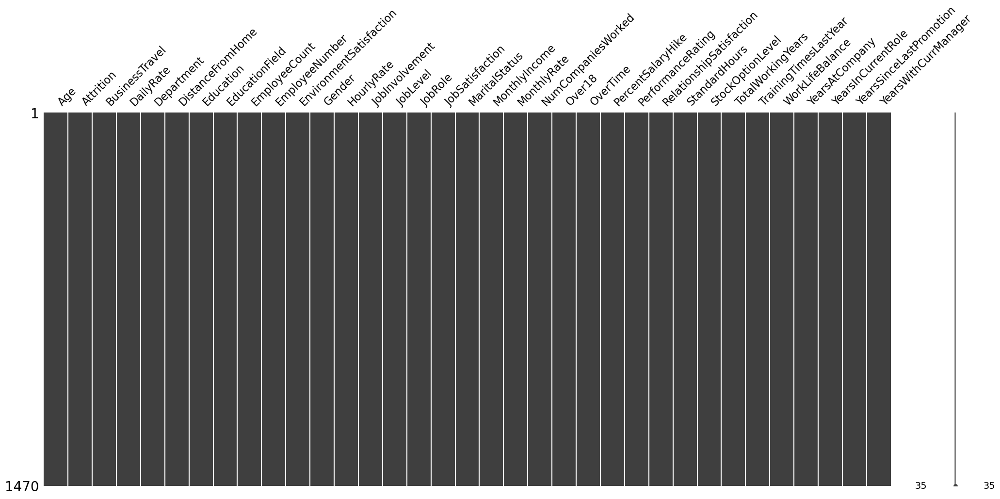

In [11]:
ms.matrix(df)

## find duplicate values

In [12]:
df.duplicated().sum()

0

there is no duplicated value present in the data set

In [13]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

From above we can see that many of the columns has low unique values and hence can be termed as classified columns. Our target variable 'Attrition" has only two values so we can say this is a case of classification problem. We can also drop those columns which have only one unique value as they are same for every row so dropping them wont make a difference to the prediction. Also EmployeeNumber column provides just a serial number for each employee so that also wont be necessary for our model building.

In [14]:
df.drop(columns=['EmployeeCount','Over18','StandardHours','EmployeeNumber'],inplace=True)

In [15]:
df["Attrition"].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

## seperate the data columns

In [16]:
categorial_data=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorial_data.append(i)
print("categorial columns:",categorial_data)
print("\n")

Numerical_data=[]
for i in df.dtypes.index:
    if df.dtypes[i] !="object":
        Numerical_data.append(i)
print("Numerical columns:",Numerical_data)
print("\n")
print("No.of Numerical column:")
print(len(Numerical_data))


categorial columns: ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']


Numerical columns: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


No.of Numerical column:
23


In [17]:
# Describe function for integer datatype
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


<font size=5>**Visualization**

No     1233
Yes     237
Name: Attrition, dtype: int64


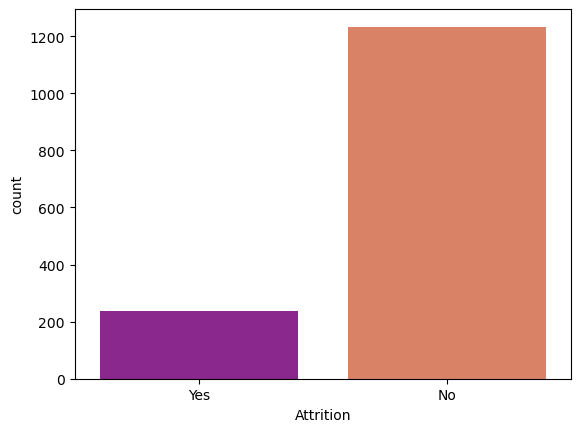

In [18]:
print(df["Attrition"].value_counts())
sns.countplot(x='Attrition', data=df, palette="plasma")
plt.show()

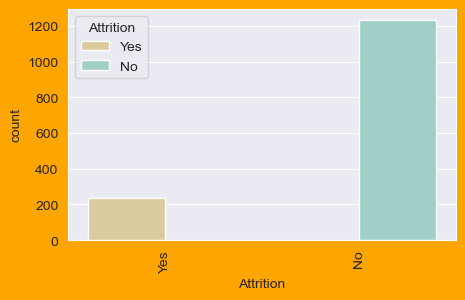

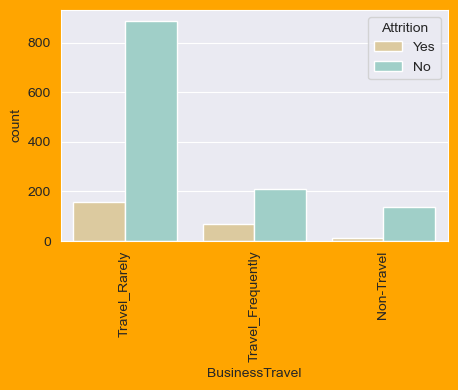

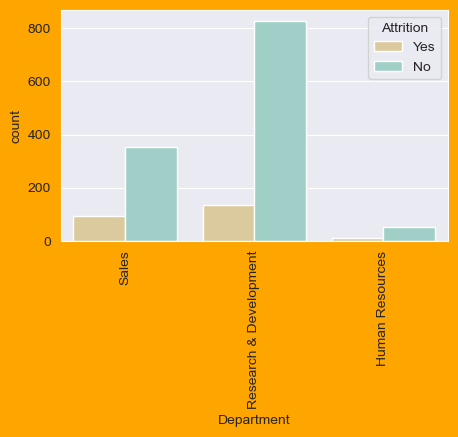

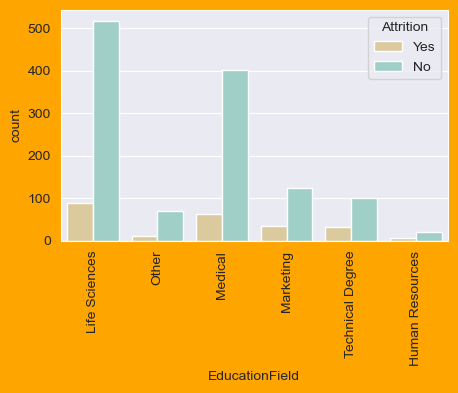

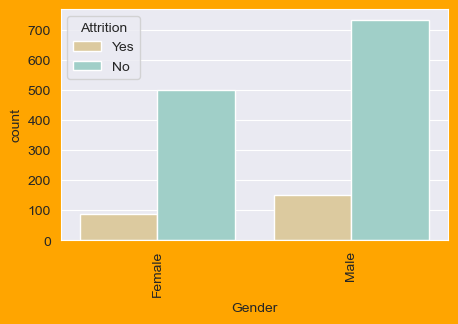

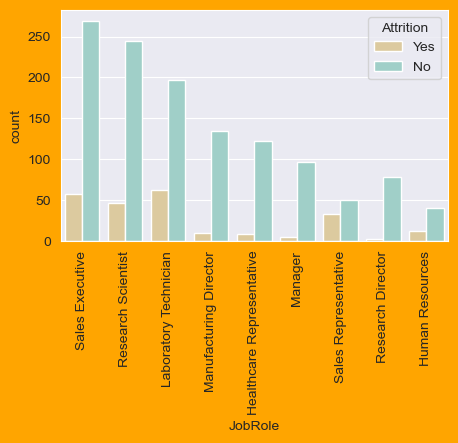

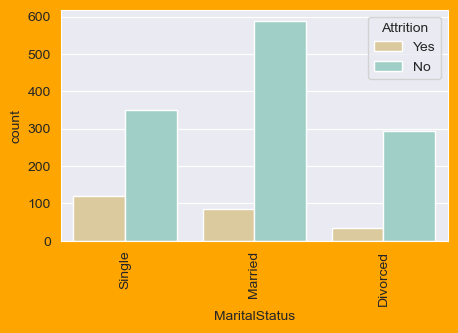

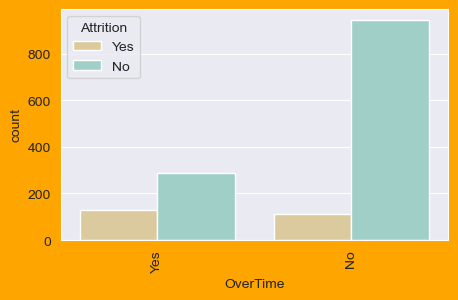

In [19]:
sns.set_style('darkgrid')
for i in categorial_data:
    plt.figure(figsize=(5,3),facecolor='orange')
    plt.xticks(rotation=90)
    sns.countplot(x=i,data=df,hue='Attrition',palette='BrBG')
    plt.show()

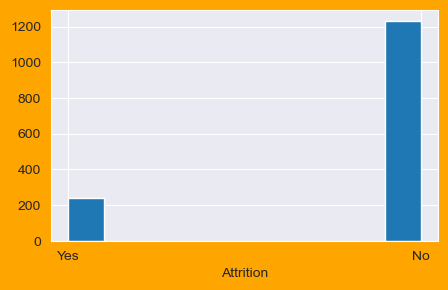

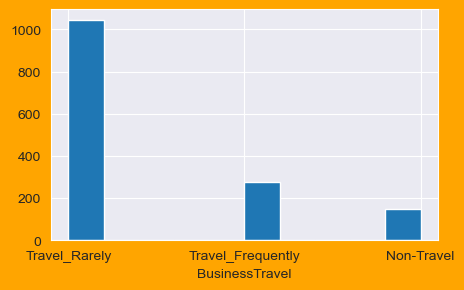

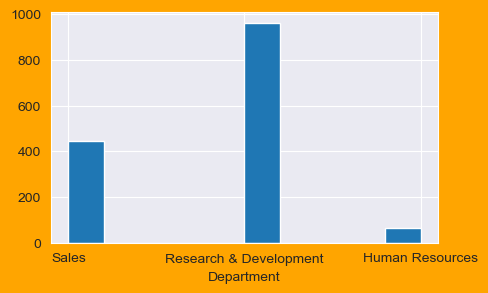

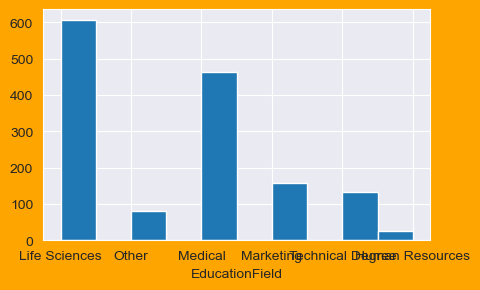

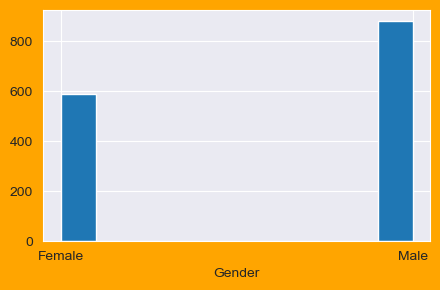

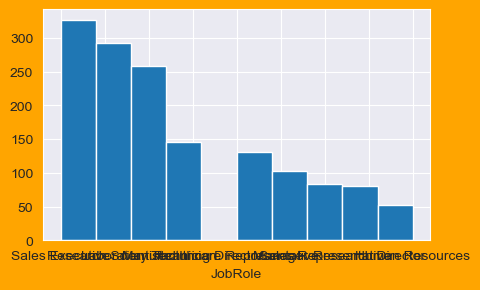

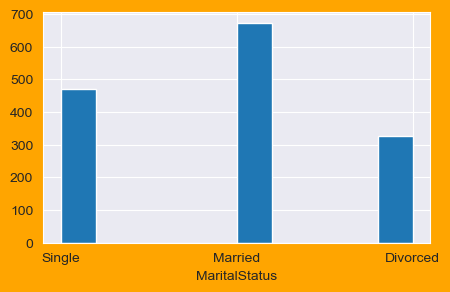

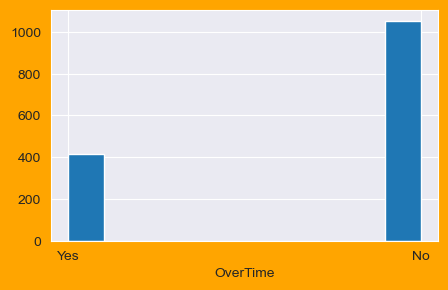

In [20]:
sns.set_style('darkgrid')
for i in categorial_data:
    plt.figure(figsize=(5,3),facecolor='orange')
    plt.hist(df[i],bins=10)
    plt.xlabel(i)
    plt.show()

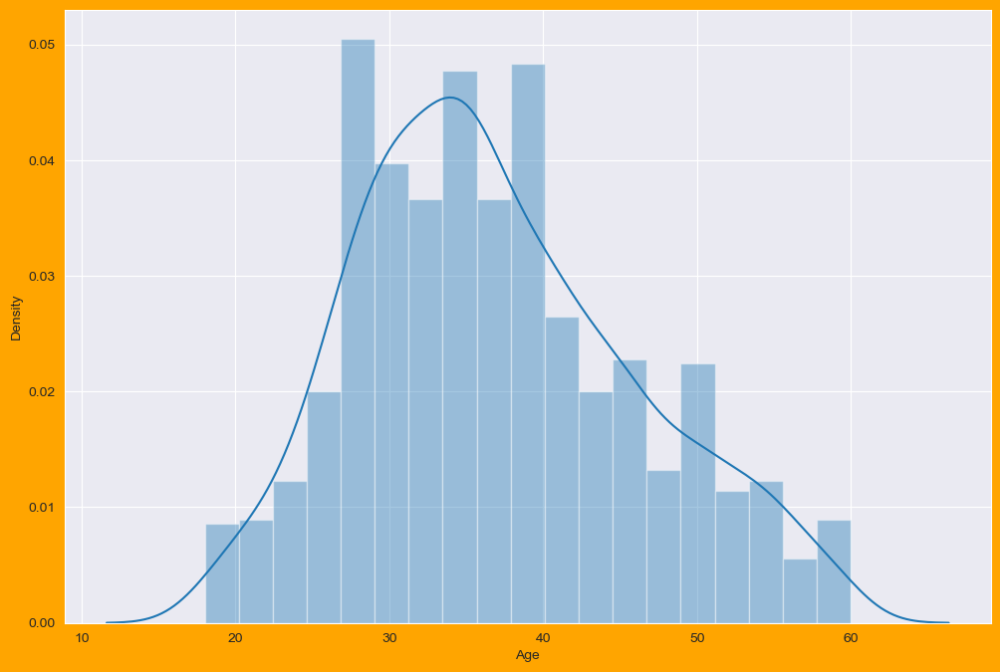

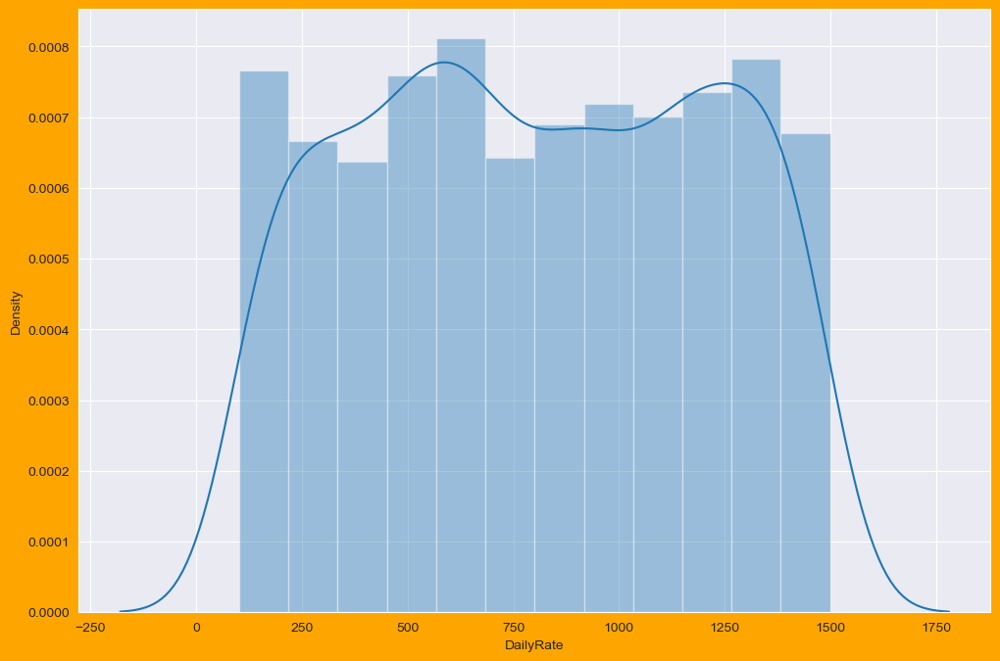

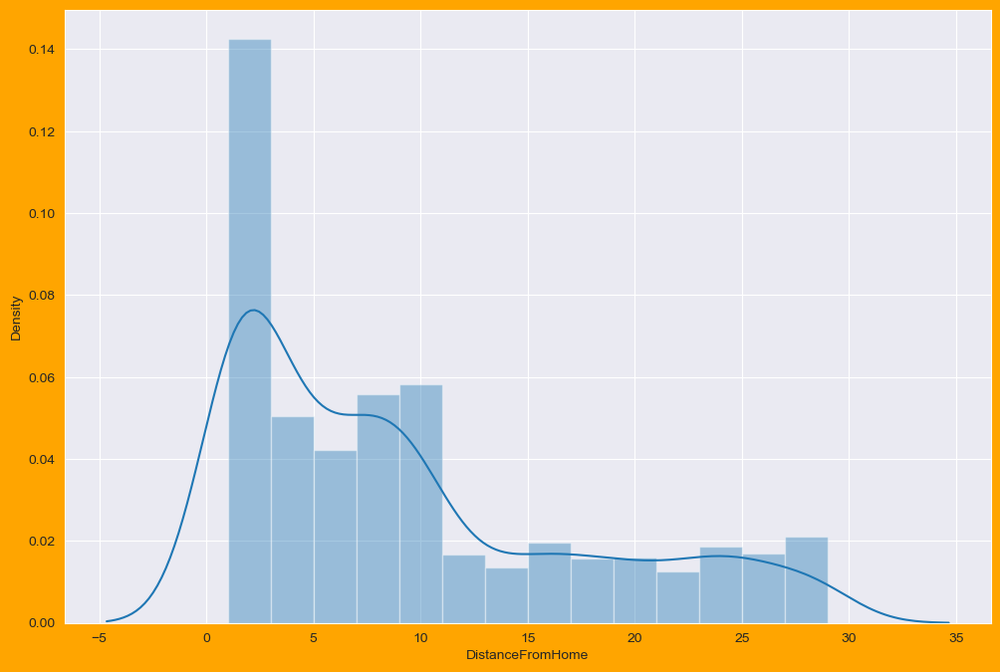

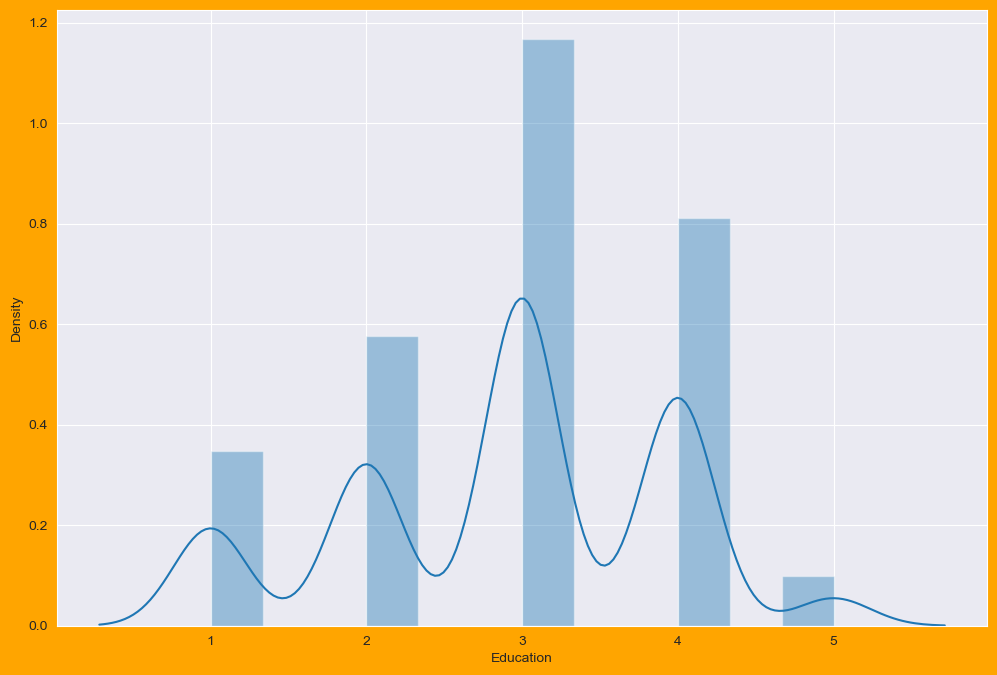

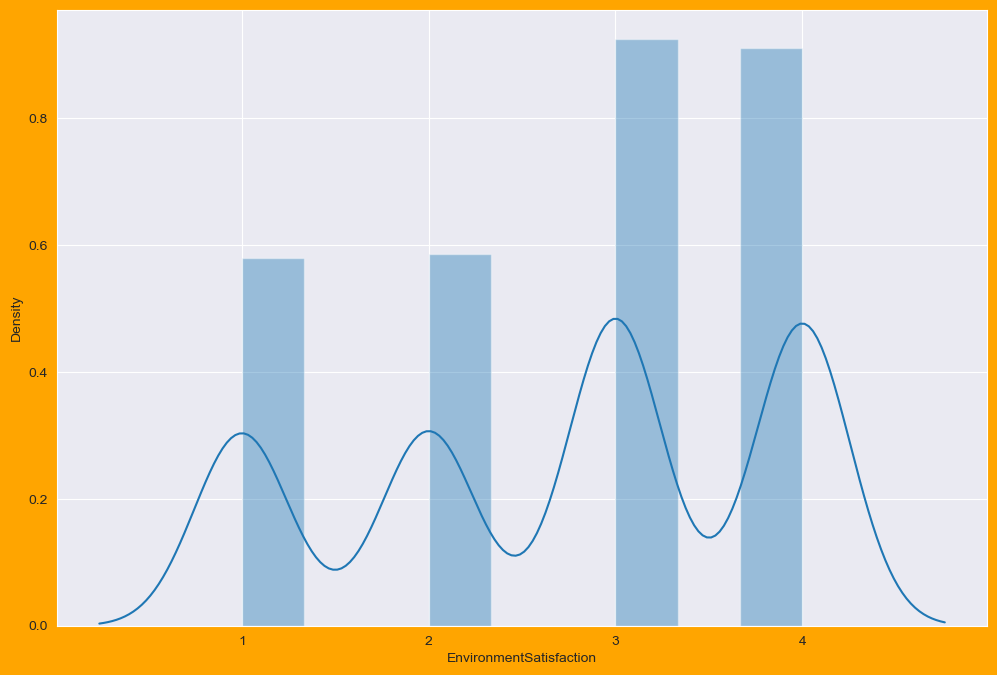

...

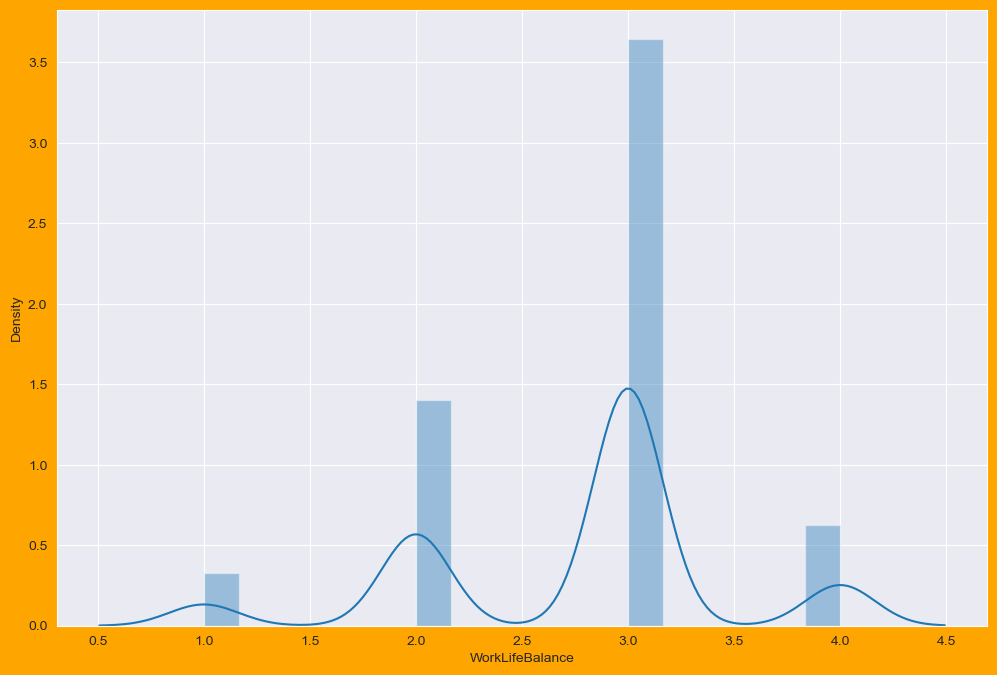

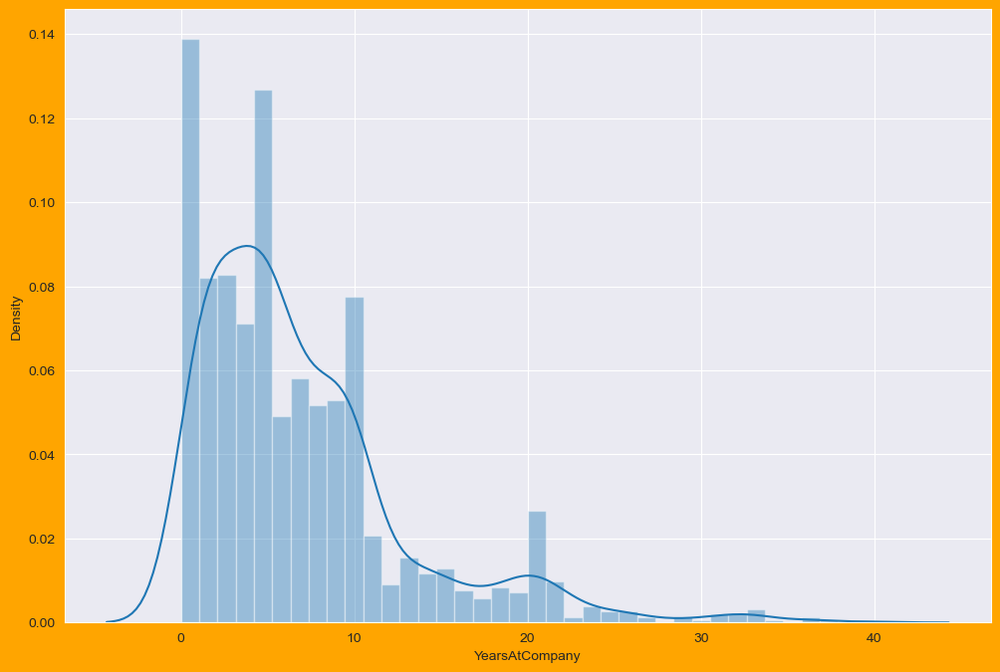

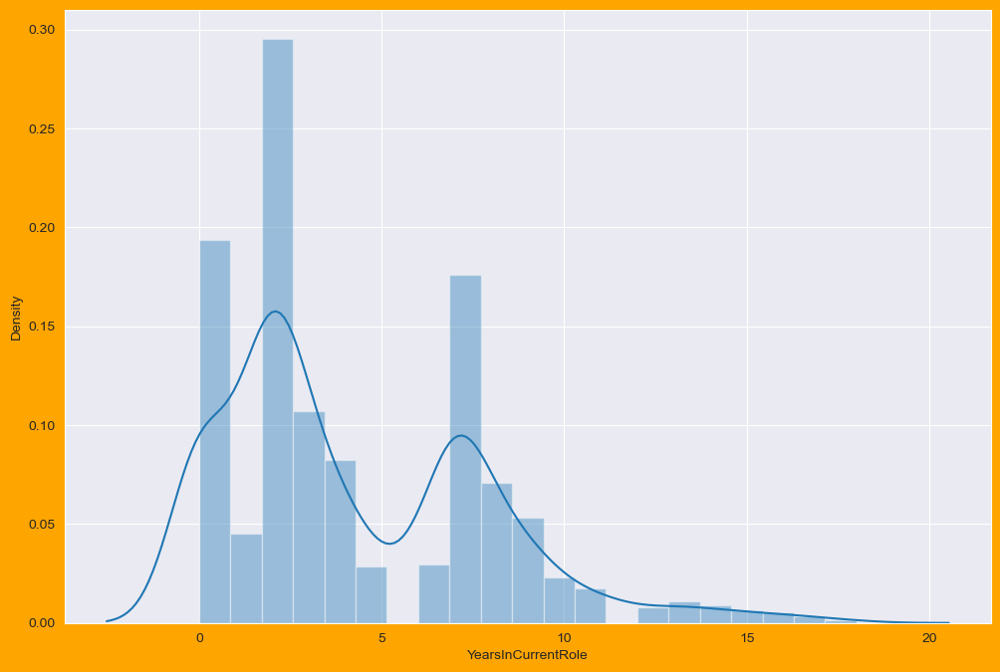

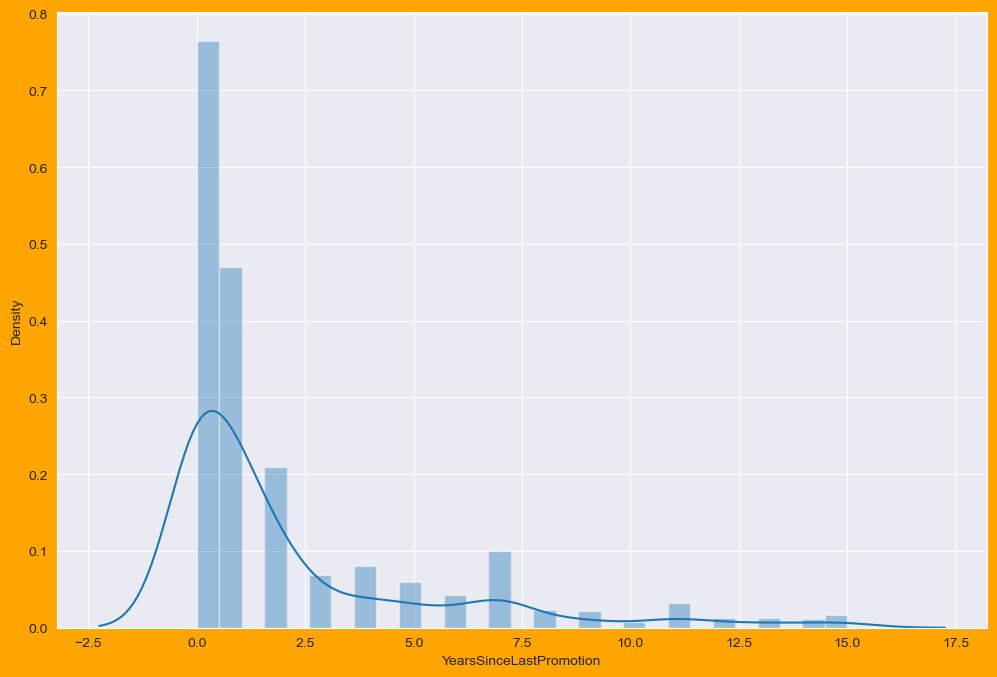

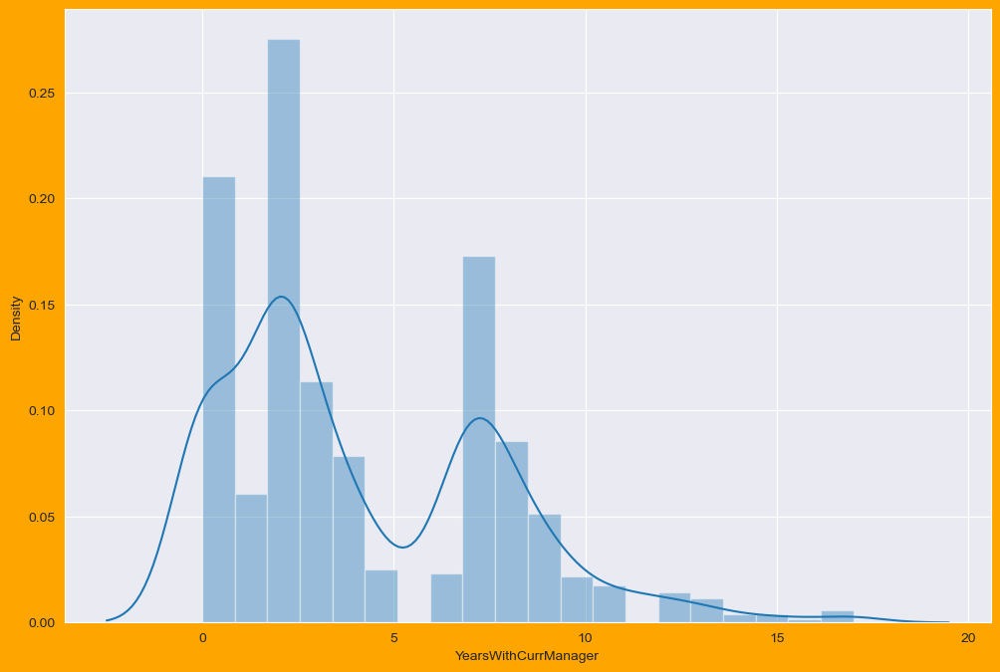

In [21]:
for i in Numerical_data:
    plt.figure(figsize=(12,8),facecolor='orange')
    sns.distplot(df[i])
    plt.show()

In [22]:
rating_cat_cols=['EnvironmentSatisfaction','JobSatisfaction','WorkLifeBalance','RelationshipSatisfaction','PerformanceRating','JobInvolvement']

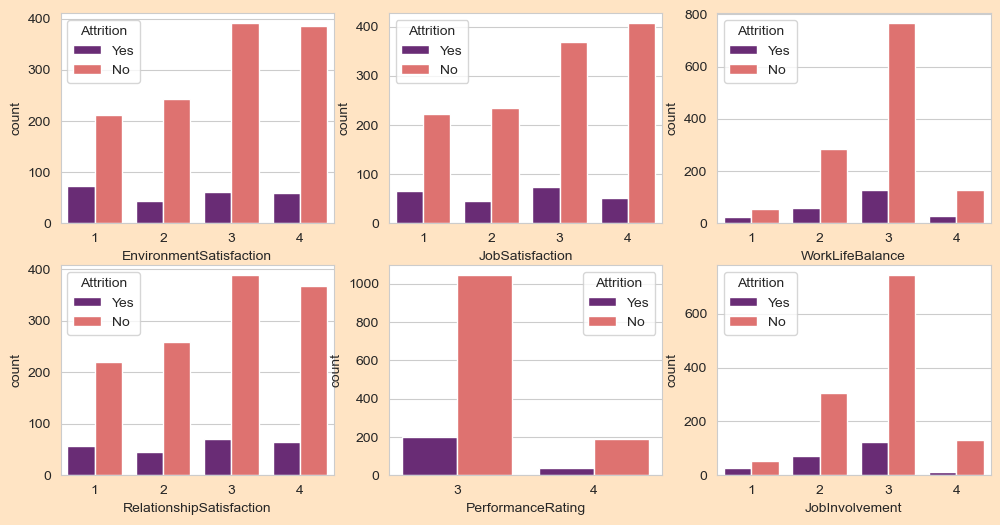

In [23]:
sns.set_style('whitegrid')
plt.figure(facecolor='bisque',figsize=(12,6))
p=1
for i in rating_cat_cols:
    if p<=8:
        ax=plt.subplot(2,3,p)
        sns.countplot(x=i,data=df,hue='Attrition',palette='magma')
    p+=1

## Bivariate Analysis

<AxesSubplot:xlabel='Department', ylabel='MonthlyIncome'>

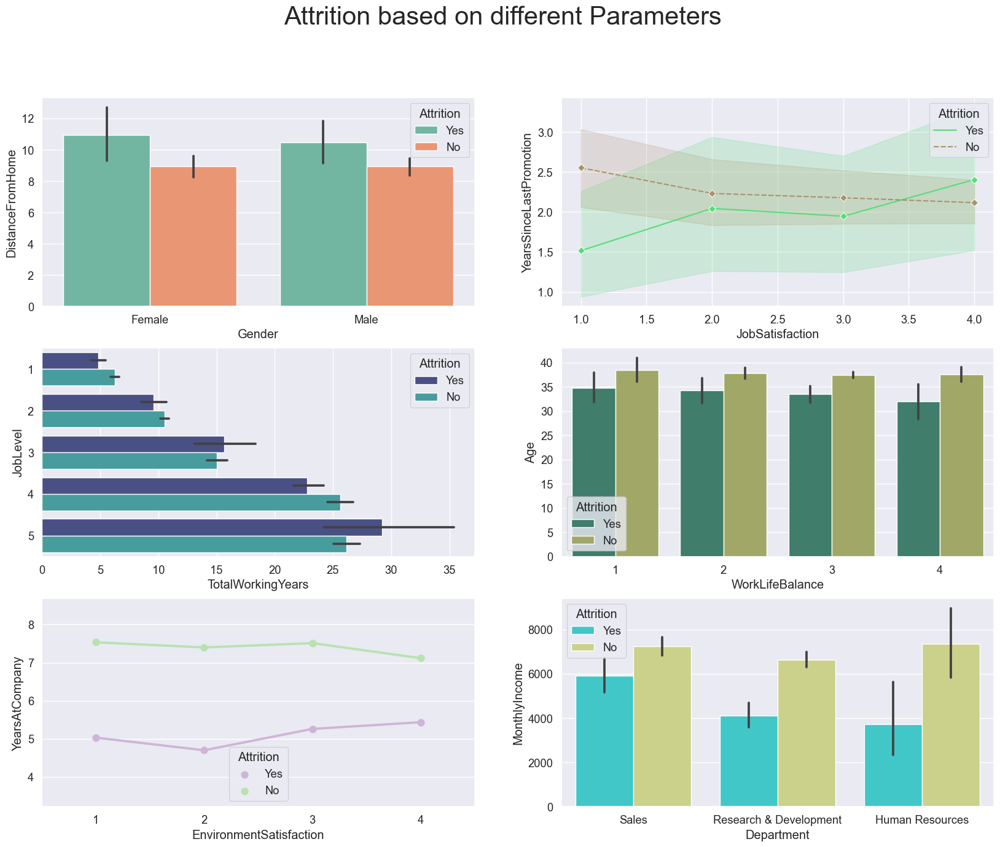

In [24]:
sns.set(font_scale=1.2)
fig,axes = plt.subplots(3, 2, figsize=(20,15))
fig.suptitle('Attrition based on different Parameters',fontsize=30) 
sns.barplot(ax=axes[0, 0],x='Gender',y='DistanceFromHome',hue='Attrition',data=df,palette="Set2") 
sns.lineplot(ax=axes[0, 1],x='JobSatisfaction',y='YearsSinceLastPromotion',hue='Attrition',style='Attrition',marker='D',data=df,palette="terrain")
sns.barplot(ax=axes[1, 0],y='JobLevel',x='TotalWorkingYears',hue='Attrition',data=df,palette="mako",orient='h')
sns.barplot(ax=axes[1, 1],x='WorkLifeBalance',y='Age',hue='Attrition',data=df,palette="gist_earth")
sns.pointplot(ax=axes[2, 0],x='EnvironmentSatisfaction',y='YearsAtCompany',hue='Attrition',data=df,palette="PRGn",errwidth=0)
sns.barplot(ax=axes[2, 1],x='Department',y='MonthlyIncome',hue='Attrition',data=df,palette='rainbow')

From above graphs we notice that-
1) Attrition increases with the increase in distance from home specially for women/
2) Attrition is more when there is less job satisfaction but as the years since last promotion increases even then there is attrition regardless of job satisfaction
3) Total working hours increases with the job level and so does the attrition.
4) Attrition is less inversely related to years in company.
5) Most attrition is in the sales department of the company.

## Multivariate Analysis

### Pair Plot

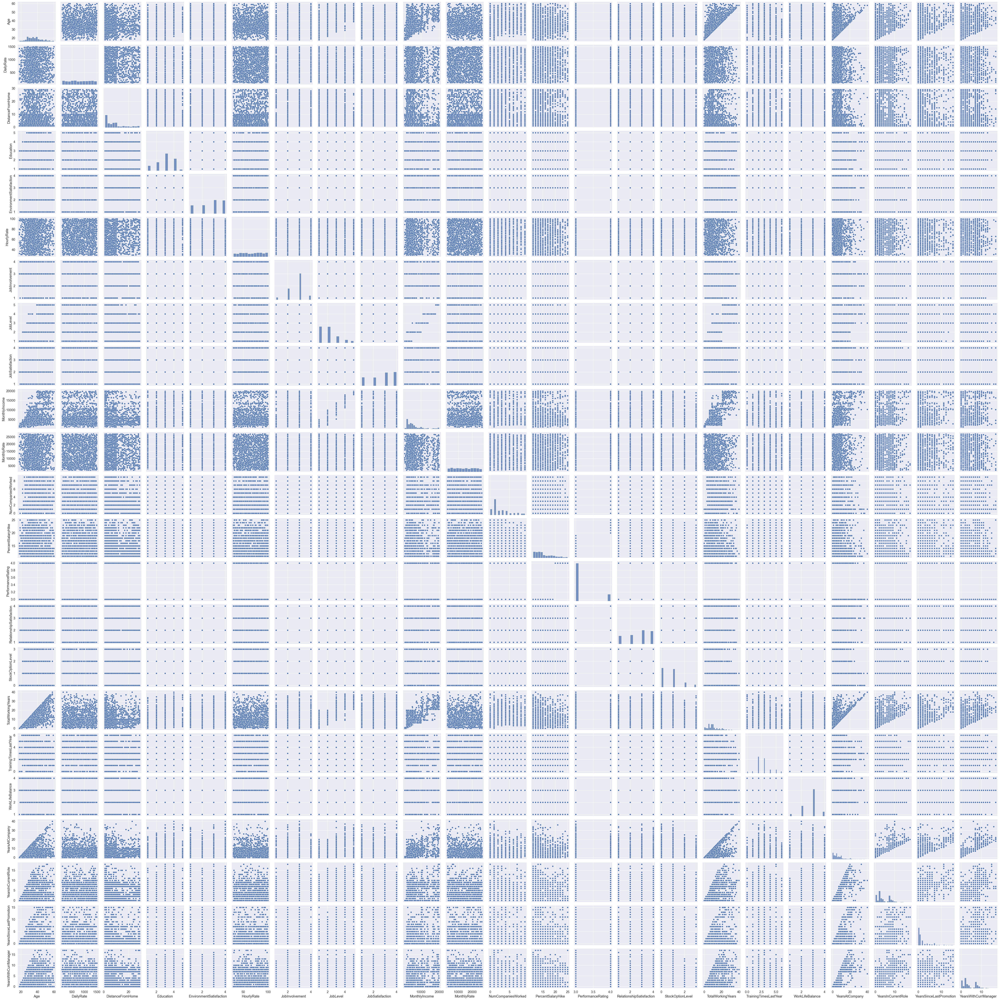

In [25]:
sns.pairplot(df)

### Encoding

In [26]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()
df.replace({'Attrition':{'No':0,'Yes':1}},inplace=True)
df[ ['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']]=oe.fit_transform(df[ ['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']])
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2.0,1102,2.0,1,2,1.0,2,0.0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1.0,279,1.0,8,1,1.0,3,1.0,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2.0,1373,1.0,2,2,4.0,4,1.0,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1.0,1392,1.0,3,4,1.0,4,0.0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2.0,591,1.0,2,1,3.0,1,1.0,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1.0,884,1.0,23,2,3.0,3,1.0,...,3,3,1,17,3,3,5,2,0,3
1466,39,0,2.0,613,1.0,6,1,3.0,4,1.0,...,3,1,1,9,5,3,7,7,1,7
1467,27,0,2.0,155,1.0,4,3,1.0,2,1.0,...,4,2,1,6,0,3,6,2,0,3
1468,49,0,1.0,1023,2.0,2,3,3.0,4,1.0,...,3,4,0,17,3,2,9,6,0,8


In [27]:
#checking if all the categorial data has changed into Numerical data
categorial_data=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorial_data.append(i)
print("categorial columns:",categorial_data)
print("\n")

Numerical_data=[]
for i in df.dtypes.index:
    if df.dtypes[i] !="object":
        Numerical_data.append(i)
print("Numerical columns:",Numerical_data)
print("\n")
print("No.of Numerical column:")
print(len(Numerical_data))


categorial columns: []


Numerical columns: ['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome', 'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


No.of Numerical column:
31


In [28]:
df.dtypes

Age                           int64
Attrition                     int64
BusinessTravel              float64
DailyRate                     int64
Department                  float64
DistanceFromHome              int64
Education                     int64
EducationField              float64
EnvironmentSatisfaction       int64
Gender                      float64
HourlyRate                    int64
JobInvolvement                int64
JobLevel                      int64
JobRole                     float64
JobSatisfaction               int64
MaritalStatus               float64
MonthlyIncome                 int64
MonthlyRate                   int64
NumCompaniesWorked            int64
OverTime                    float64
PercentSalaryHike             int64
PerformanceRating             int64
RelationshipSatisfaction      int64
StockOptionLevel              int64
TotalWorkingYears             int64
TrainingTimesLastYear         int64
WorkLifeBalance               int64
YearsAtCompany              

all changed

### Correlation

In [29]:
df.corr()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.031882,-0.001686,0.208034,-0.040873,0.010146,-0.036311,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.063991,0.077924,-0.031373,0.026846,-0.103369,0.029453,...,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,0.004174,-0.032981,...,-0.026341,-0.035986,-0.016727,0.034226,0.015240,-0.011256,-0.014575,-0.011497,-0.032591,-0.022636
DailyRate,0.010661,-0.056652,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,0.018355,-0.011716,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
Department,-0.031882,0.063991,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,-0.019395,-0.041583,...,-0.024604,-0.022414,-0.012193,-0.015762,0.036875,0.026383,0.022920,0.056315,0.040061,0.034282
DistanceFromHome,-0.001686,0.077924,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,-0.016075,-0.001851,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,-0.027128,-0.016547,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EducationField,-0.040873,0.026846,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,0.043163,-0.002504,...,-0.005614,-0.004378,-0.016185,-0.027848,0.049195,0.041191,-0.018692,-0.010506,0.002326,-0.004130
EnvironmentSatisfaction,0.010146,-0.103369,0.004174,0.018355,-0.019395,-0.016075,-0.027128,0.043163,1.000000,0.000508,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
Gender,-0.036311,0.029453,-0.032981,-0.011716,-0.041583,-0.001851,-0.016547,-0.002504,0.000508,1.000000,...,-0.013859,0.022868,0.012716,-0.046881,-0.038787,-0.002753,-0.029747,-0.041483,-0.026985,-0.030599


Positive correlation - A correlation of +1 indicates a perfect positive correlation, meaning that both variables move in the same direction together.

Negative correlation - A correlation of –1 indicates a perfect negative correlation, meaning that as one variable goes up, the other goes down.

<AxesSubplot:>

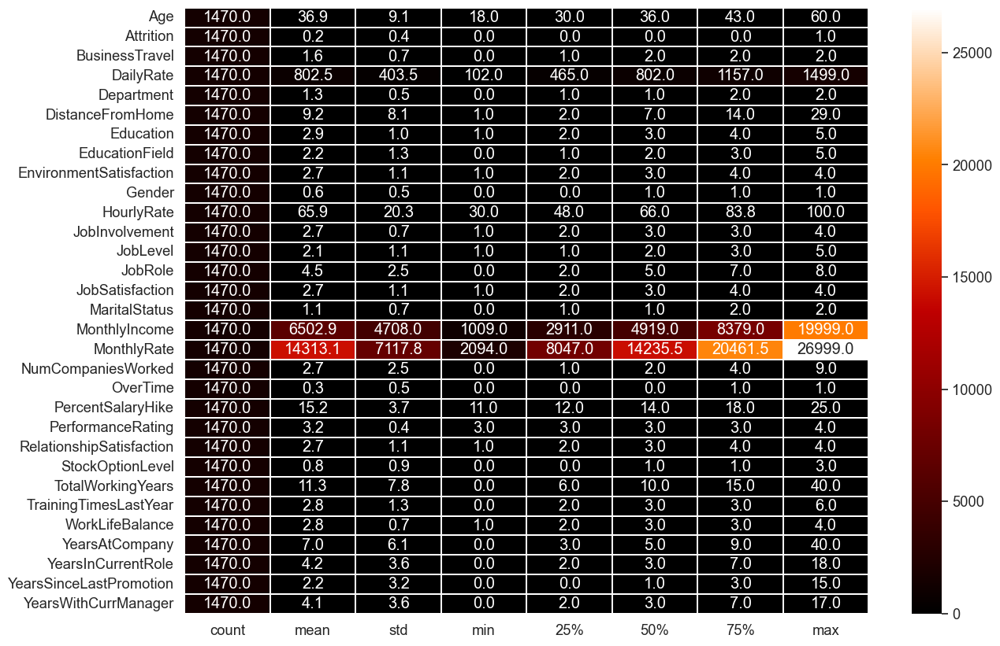

In [30]:
plt.figure(figsize=(14,10))
sns.heatmap(df.describe().T,linewidth=0.3,fmt='0.1f' ,annot=True,cmap='gist_heat')

heatmap highlights that , "monthly income and monthly rate" column need feature scaling because of skewness,outliers are there

## Visualizing the correlation matrix by plotting heat map.

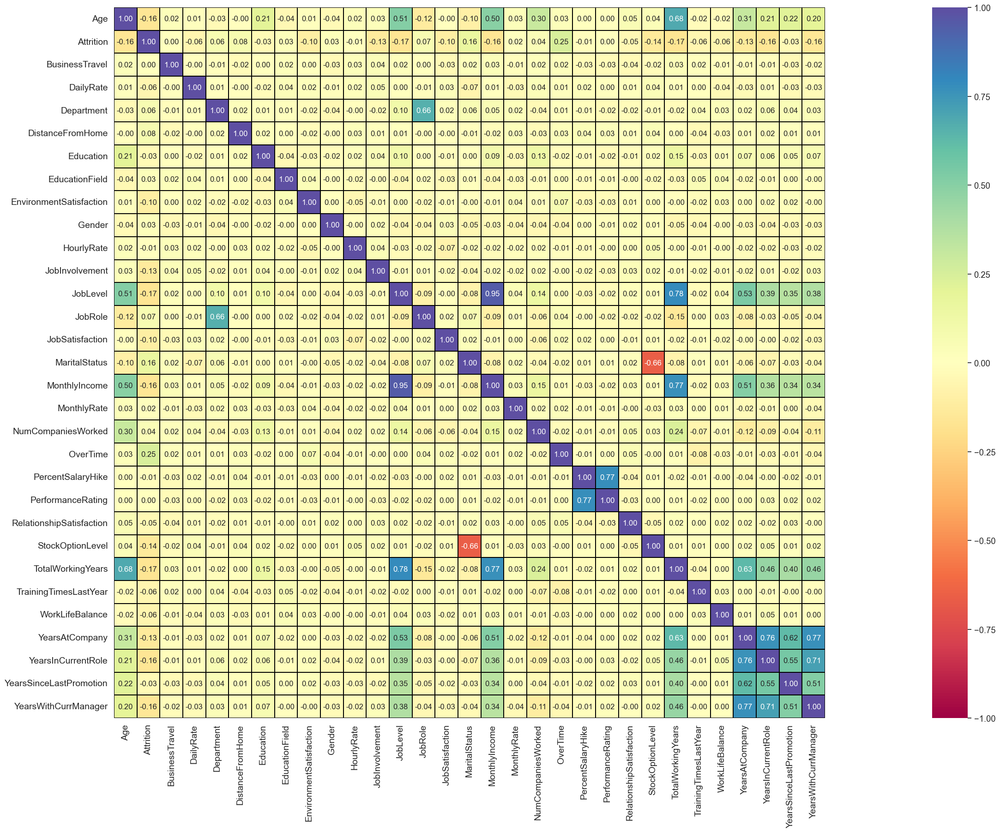

In [31]:
lower_triangle = np.tril(df.corr())
plt.figure(figsize=(60,20))
sns.heatmap(df.corr(),linewidths=.1,linecolor='black', vmin=-1, vmax=1, annot=True, square=True, fmt='0.2f', 
            annot_kws={'size':12}, cmap="Spectral")
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

correlation between Attrition and overtime is there

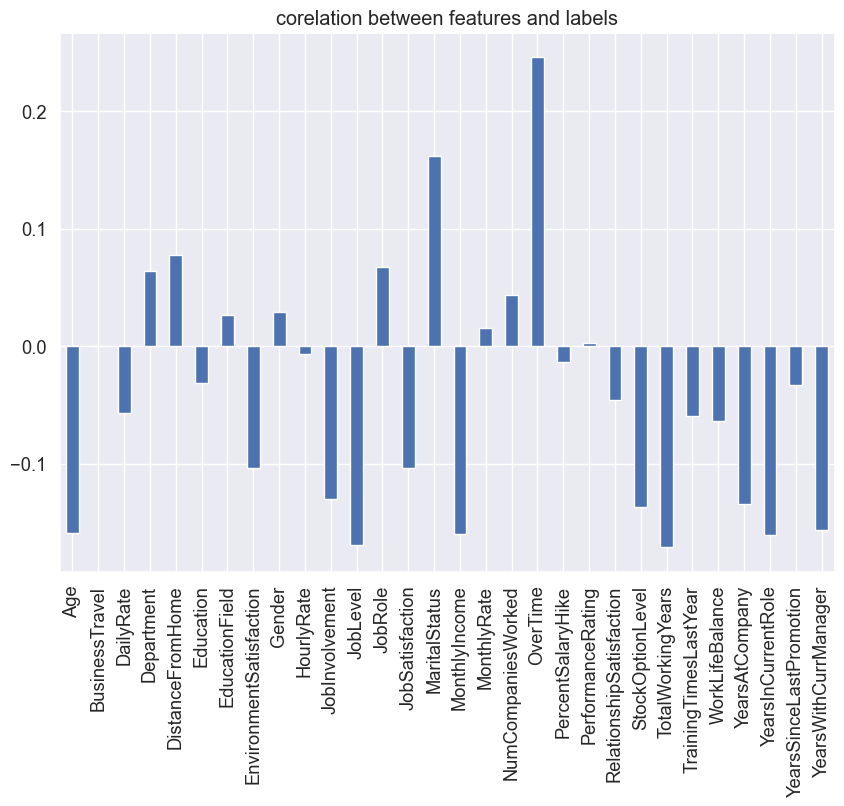

In [32]:
# Correlation between features and label:

# Replacing attrition column values:
df['Attrition'].replace(['Yes','No'],[1,0],inplace=True)

df.drop(columns = 'Attrition',axis = 1).corrwith(df.Attrition).plot(kind='bar',grid=True,figsize=(10,7),title='corelation between features and labels')
plt.show()

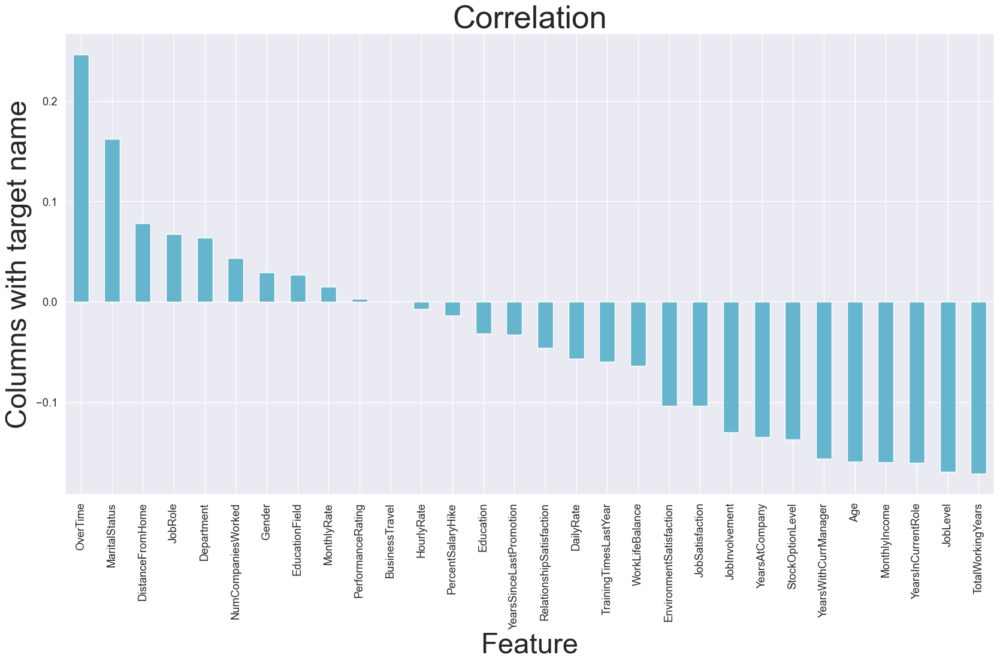

In [33]:
plt.figure(figsize=(20,10))
df.corr()['Attrition'].sort_values(ascending=False).drop(['Attrition']).plot(kind='bar',color='c')
plt.xlabel('Feature', fontsize=34)
plt.ylabel('Columns with target name', fontsize=34)
plt.title('Correlation',fontsize=38)
plt.show()

From above Plotting we can see features from hourly rate toTotal working years are negatively correlated.Business Travel has almost no relation.

# Checking outliers

### Checking for outliers using boxplot of univariate analysis

Age                            AxesSubplot(0.125,0.839474;0.352273x0.0405263)
Attrition                   AxesSubplot(0.547727,0.839474;0.352273x0.0405263)
BusinessTravel                 AxesSubplot(0.125,0.790842;0.352273x0.0405263)
DailyRate                   AxesSubplot(0.547727,0.790842;0.352273x0.0405263)
Department                     AxesSubplot(0.125,0.742211;0.352273x0.0405263)
DistanceFromHome            AxesSubplot(0.547727,0.742211;0.352273x0.0405263)
Education                      AxesSubplot(0.125,0.693579;0.352273x0.0405263)
EducationField              AxesSubplot(0.547727,0.693579;0.352273x0.0405263)
EnvironmentSatisfaction        AxesSubplot(0.125,0.644947;0.352273x0.0405263)
Gender                      AxesSubplot(0.547727,0.644947;0.352273x0.0405263)
HourlyRate                     AxesSubplot(0.125,0.596316;0.352273x0.0405263)
JobInvolvement              AxesSubplot(0.547727,0.596316;0.352273x0.0405263)
JobLevel                       AxesSubplot(0.125,0.547684;0.3522

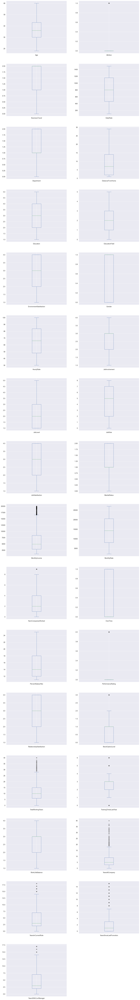

In [34]:
df.plot(kind='box',subplots=True,figsize=(20,150),layout=(16,2))

The above boxplots represents that there are some outliers present there. so we will remove them before training our model

## Removing outliers using Zscore 

In [35]:
from scipy.stats import zscore
z=np.abs(zscore(df))
df1=df[(z<3).all(axis=1)]
print ("Shape of the dataframe before removing outliers:",df.shape)
print ("Shape of the dataframe after removing outliers:",df1.shape)
print ("Data loss post outlier removal:",((df.shape[0]-df1.shape[0])/df.shape[0]*100),'%')

Shape of the dataframe before removing outliers: (1470, 31)
Shape of the dataframe after removing outliers: (1387, 31)
Data loss post outlier removal: 5.646258503401361 %


As the data loss is less than 10%, it is acceptable.

### Checking for skewness using distplot

BusinessTravel             -1.426774
WorkLifeBalance            -0.557100
JobInvolvement             -0.501401
Gender                     -0.417296
JobRole                    -0.386843
JobSatisfaction            -0.345612
EnvironmentSatisfaction    -0.325285
RelationshipSatisfaction   -0.295686
Education                  -0.289024
MaritalStatus              -0.160952
HourlyRate                 -0.030481
DailyRate                  -0.017078
MonthlyRate                 0.030596
Department                  0.183919
Age                         0.472280
EducationField              0.544868
TrainingTimesLastYear       0.577614
YearsWithCurrManager        0.694506
YearsInCurrentRole          0.726675
PercentSalaryHike           0.800592
OverTime                    0.954751
DistanceFromHome            0.954752
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
NumCompaniesWorked          1.037715
JobLevel                    1.126075
YearsAtCompany              1.248623
M

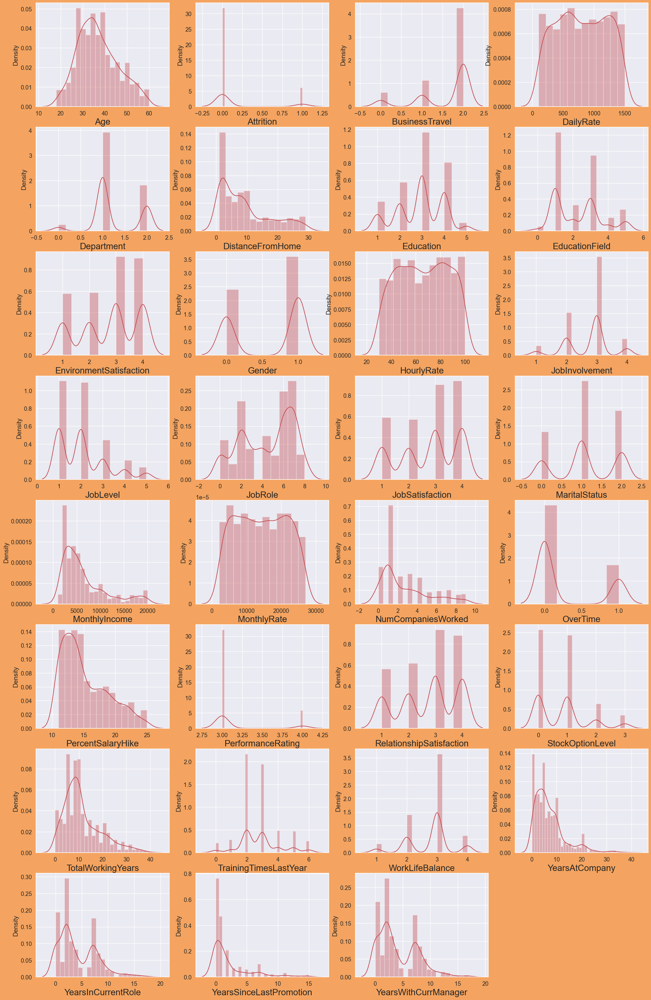

In [36]:
plt.figure(figsize=(25,40),facecolor='sandybrown')
pltno=1

for c in df:
    if pltno<=31:
        ax=plt.subplot(8,4,pltno)
        sns.distplot(df[c],color='r')
        plt.xlabel(c,fontsize=20)
        
    pltno+=1
df1.skew().sort_values()

From above distribution we can see that almost all the variables display a bell shaped curve and hence normaly distributed but in some columns there is skeness above the accepted range, so we will apply cuberoot formula to decrease it till it reaches inside the acceptance range

In [37]:
df1.skew().sort_values()

BusinessTravel             -1.426774
WorkLifeBalance            -0.557100
JobInvolvement             -0.501401
Gender                     -0.417296
JobRole                    -0.386843
JobSatisfaction            -0.345612
EnvironmentSatisfaction    -0.325285
RelationshipSatisfaction   -0.295686
Education                  -0.289024
MaritalStatus              -0.160952
HourlyRate                 -0.030481
DailyRate                  -0.017078
MonthlyRate                 0.030596
Department                  0.183919
Age                         0.472280
EducationField              0.544868
TrainingTimesLastYear       0.577614
YearsWithCurrManager        0.694506
YearsInCurrentRole          0.726675
PercentSalaryHike           0.800592
OverTime                    0.954751
DistanceFromHome            0.954752
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
NumCompaniesWorked          1.037715
JobLevel                    1.126075
YearsAtCompany              1.248623
M

### Removing Skewness

In [38]:
for col in df1.columns:
    if df1.skew().loc[col]>0.55:
        df1[col]=np.log1p(df1[col])

In [39]:
df1.skew().sort_values()

BusinessTravel             -1.426774
TrainingTimesLastYear      -1.044321
TotalWorkingYears          -0.728348
WorkLifeBalance            -0.557100
JobInvolvement             -0.501401
Gender                     -0.417296
YearsInCurrentRole         -0.390406
JobRole                    -0.386843
YearsAtCompany             -0.379527
YearsWithCurrManager       -0.347018
JobSatisfaction            -0.345612
EnvironmentSatisfaction    -0.325285
RelationshipSatisfaction   -0.295686
Education                  -0.289024
MaritalStatus              -0.160952
DistanceFromHome           -0.031570
HourlyRate                 -0.030481
DailyRate                  -0.017078
MonthlyRate                 0.030596
NumCompaniesWorked          0.101288
Department                  0.183919
StockOptionLevel            0.275912
MonthlyIncome               0.318873
Age                         0.472280
PercentSalaryHike           0.496106
JobLevel                    0.497167
EducationField              0.544868
Y

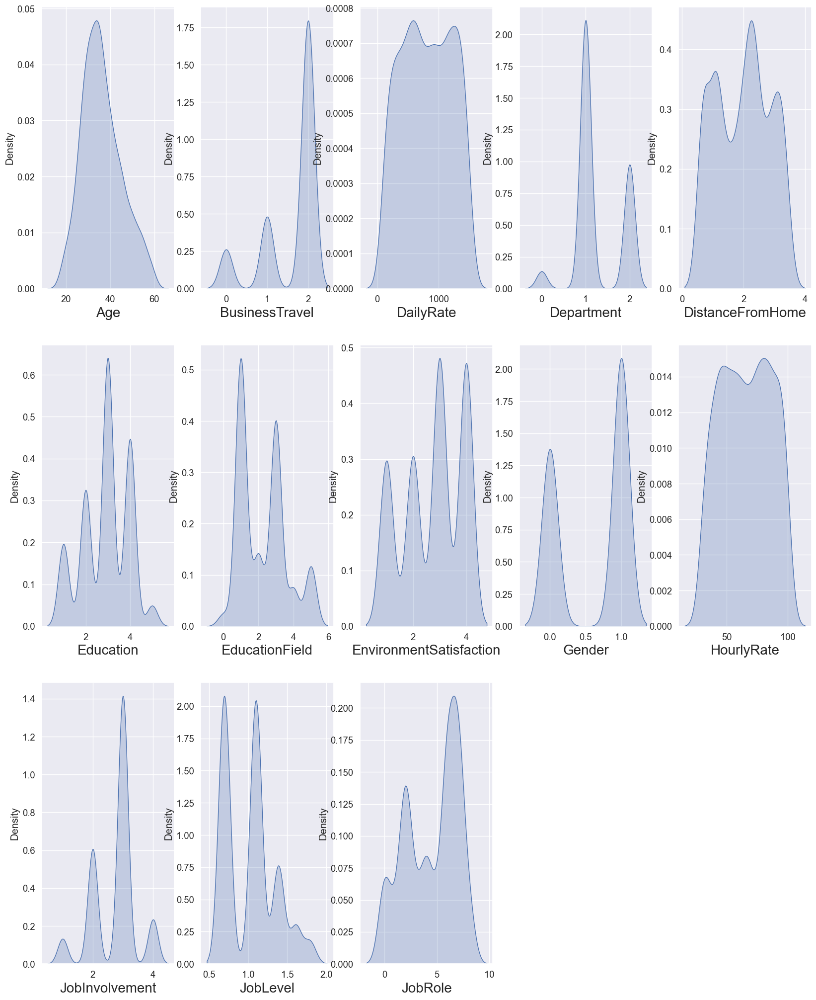

In [40]:
#checking the skewness again through Dist plot.

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1
features = df1.drop("Attrition", axis=1)
for column in features:
    if plotnumber<=13:
        ax = plt.subplot(3,5,plotnumber)
        sns.distplot(df1[column], hist=False, kde_kws={"shade": True})
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.show()

## Scaling the model

In [41]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=df1.drop(['Attrition'],axis=1)
X=df1.drop(['Attrition'],axis=1)

In [42]:
X=sc.fit_transform(X)
x=pd.DataFrame(X,columns=x.columns)
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.536681,0.593126,0.734325,1.405373,-1.502086,-0.876177,-0.940815,-0.665328,-1.229911,1.388670,...,-0.424765,-1.575817,-1.052154,-0.052493,-3.388651,-2.501172,0.297751,0.372567,-0.964086,0.628647
1,1.442111,-0.905354,-1.307769,-0.496337,0.253886,-1.853858,-0.940815,0.251978,0.813067,-0.239091,...,2.354241,1.199034,0.468783,0.247982,0.302431,0.336558,0.939176,0.980909,-0.028096,0.993844
2,0.083966,0.593126,1.406752,-0.496337,-1.028716,-0.876177,1.305159,1.169285,0.813067,1.290017,...,-0.424765,-0.650866,-1.052154,-0.228855,0.302431,0.336558,-2.463747,-1.710586,-0.964086,-1.645896
3,-0.368749,-0.905354,1.453896,-0.496337,-0.692855,1.079185,-0.940815,1.169285,-1.229911,-0.485721,...,-0.424765,0.274084,-1.052154,-0.052493,0.302431,0.336558,0.654398,0.980909,0.907895,-1.645896
4,-1.047821,0.593126,-0.533609,-0.496337,-1.028716,-1.853858,0.556501,-1.582635,0.813067,-1.274939,...,-0.424765,1.199034,0.468783,-0.428798,0.302431,0.336558,-0.904674,-0.288613,0.519424,-0.251267
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,-0.029213,-0.905354,0.193406,-0.496337,1.398978,-0.876177,0.556501,0.251978,0.813067,-1.225613,...,-0.424765,0.274084,0.468783,0.985391,0.302431,0.336558,0.078991,-0.288613,-0.964086,0.113930
1383,0.310324,0.593126,-0.479021,-0.496337,-0.039518,-1.853858,0.556501,1.169285,0.813067,-1.176286,...,-0.424765,-1.575817,0.468783,0.105269,1.382003,0.336558,0.487249,0.980909,-0.028096,0.993844
1384,-1.047821,0.593126,-1.615447,-0.496337,-0.432340,0.101504,-0.940815,-0.665328,0.813067,1.043387,...,2.354241,-0.650866,0.468783,-0.428798,-3.388651,0.336558,0.297751,-0.288613,-0.964086,0.113930
1385,1.442111,-0.905354,0.538304,1.405373,-1.028716,0.101504,0.556501,1.169285,0.813067,-0.140439,...,-0.424765,1.199034,-1.052154,0.985391,0.302431,-1.082307,0.803919,0.808075,-0.964086,1.143363


scaled data using standard scaler.

## Checking Multicollinearity using VIF

In [43]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif['Features'] = x.columns
vif

,VIF,Features
0,1.815297,Age
1,1.015576,BusinessTravel
2,1.025444,DailyRate
3,2.076141,Department
4,1.017246,DistanceFromHome
5,1.060778,Education
6,1.019488,EducationField
7,1.025069,EnvironmentSatisfaction
8,1.025341,Gender
9,1.023773,HourlyRate


From above we can see that all the VIF values are inside the acceptange range only which is 10. So we will not remove any columns and proceed with the data

In [52]:
df1['Attrition'] = df['Attrition'].replace(['0.693147'], ['1'])

## Balancing the data using SMOTE 

0    1158
1     229
Name: Attrition, dtype: int64

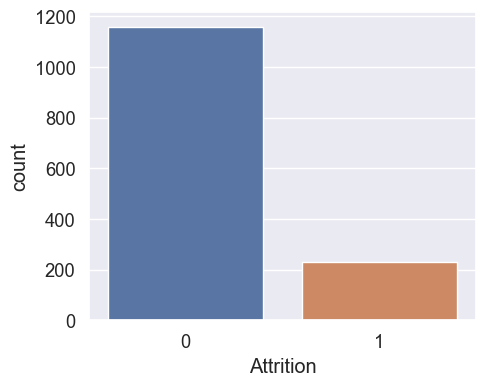

In [54]:
plt.figure(figsize=(5,4))
sns.countplot(x=df1['Attrition'])
df1['Attrition'].value_counts()

We can see that the data is imbalanced as values for 0 (no) is way more than 1 (yes). So we will use SMOTE to balance this.


In [56]:
from imblearn.over_sampling import SMOTE
f=df1.drop(['Attrition'],axis=1)
t=df1['Attrition']
smt=SMOTE(random_state=0,k_neighbors=1)
train_x,train_y=smt.fit_resample(f,t)
train_y.value_counts()

1    1158
0    1158
Name: Attrition, dtype: int64

The data is now balanced

## Finding the best random state

In [57]:
models=[GaussianNB(),LogisticRegression(),RandomForestClassifier(),KNeighborsClassifier(),DecisionTreeClassifier(), SVC(),GradientBoostingClassifier()]

In [58]:
maxAcc = 0
maxRS = 0

for i in range(1,1000):
    x_train,x_test,y_train,y_test = train_test_split(train_x,train_y,test_size = .25, random_state=i)
    for m in models:
        m.fit(x_train,y_train)
        m.score(x_train,y_train)
        pred = m.predict(x_test)
        acc = accuracy_score(y_test,pred)
        if acc>maxAcc:
            maxAcc = acc
            maxRs=i
print("Best Accuracy is:", maxAcc, "on Random State:", maxRs)

Best Accuracy is: 0.9585492227979274 on Random State: 160


## Models with their metrics

In [59]:
for m in models:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print('\033[1m','For' ,m,'\033[0m','Accuracy score is: ',accuracy_score(y_test,predm))
    print ('\n','Confusion matrix:','\n',confusion_matrix(y_test,predm))
    print ('\n','Classification Report:','\n',classification_report(y_test,predm))
    cvs=cross_val_score(m,train_x,train_y)
    print('Cross Validation Score=',cvs.mean(),'\n')
    print('*****************************************************************************')

 For GaussianNB()  Accuracy score is:  0.8134715025906736

 Confusion matrix: 
 [[209  67]
 [ 41 262]]

 Classification Report: 
               precision    recall  f1-score   support

           0       0.84      0.76      0.79       276
           1       0.80      0.86      0.83       303

    accuracy                           0.81       579
   macro avg       0.82      0.81      0.81       579
weighted avg       0.82      0.81      0.81       579

Cross Validation Score= 0.7832827511730096 

*****************************************************************************
 For LogisticRegression()  Accuracy score is:  0.7754749568221071

 Confusion matrix: 
 [[219  57]
 [ 73 230]]

 Classification Report: 
               precision    recall  f1-score   support

           0       0.75      0.79      0.77       276
           1       0.80      0.76      0.78       303

    accuracy                           0.78       579
   macro avg       0.78      0.78      0.78       579
weighted a

We see from above that random forest classifier is working the best, so we will use hyperparameter tuning on it


## Hyperparameter Tuning

In [60]:
from sklearn.model_selection import GridSearchCV
rfc=RandomForestClassifier()
param={'max_features':['auto','sqrt','log2'],
      'max_depth':[int(x) for x in np.linspace(10, 110, num = 11)],
      'criterion':['gini','entropy'],}

In [61]:
from sklearn.model_selection import GridSearchCV
rfc=RandomForestClassifier()
param={'max_features':['auto','sqrt','log2'],
      'max_depth':[int(x) for x in np.linspace(10, 110, num = 11)],
      'criterion':['gini','entropy'],}

In [62]:
final_model=RandomForestClassifier(max_features='auto',criterion='entropy',max_depth=20)
final_model.fit(x_train, y_train)
fmod_pred = final_model.predict(x_test)
fmod_acc = (accuracy_score(y_test, fmod_pred))*100
print("Accuracy score for the Best Model is:", fmod_acc)

Accuracy score for the Best Model is: 94.64594127806562


## Visualising ROC curve

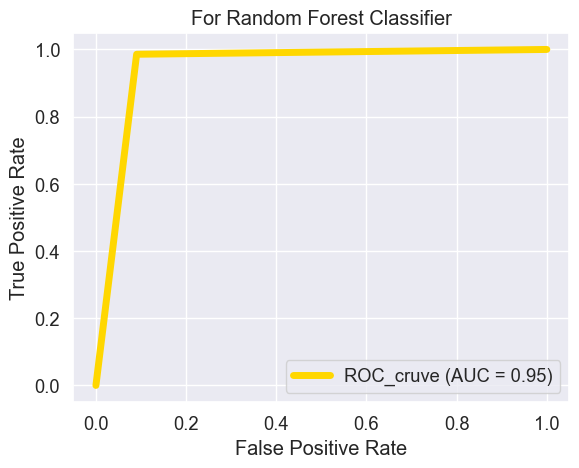

In [65]:
sns.set_style('darkgrid')
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(fmod_pred, y_test)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,estimator_name='ROC_cruve')
display.plot(lw=5,color='gold')
plt.title('For Random Forest Classifier')
plt.show()

In [ ]:
since the model without outliers performing well we will select that dataframe

### Saving the model

In [66]:
import joblib
filename='Hr analytics.pkl'
joblib.dump(final_model,"Hr analytics.pkl")

['Hr analytics.pkl']

In [74]:
import numpy as np
a=np.array(y_test)
predicted=np.array(final_model.predict(x_test))
df_com=pd.DataFrame({'original':a, 'predicted':predicted},index=range(len(a)))

In [75]:
df_com

,original,predicted
0,1,1
1,1,1
2,1,1
3,0,0
4,1,1
...,...,...
574,1,1
575,1,1
576,0,0
577,1,1


## conclusion

#### after all the data has sent to train and test,the Attrition column  data has  predicted accurately with 94.64%.

## --Thanks--